In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow import keras

from tqdm import tqdm 
from skimage.io import imread
import numpy as np
from skimage.transform import resize
import cv2

import imageio

In [ ]:
SEED = 909
BATCH_SIZE=16

IMAGE_HEIGHT = 128
IMAGE_WIDTH = 128
IMG_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH)

data_dir = '/content/drive/MyDrive/Colab Notebooks/Segmentation1/'
data_dir_train = os.path.join(data_dir, 'train')
# The images should be stored under: "data/slices/training/img/img"
data_dir_train_image = os.path.join(data_dir_train, 'Img1')
# The images should be stored under: "data/slices/training/mask/img"
data_dir_train_mask = os.path.join(data_dir_train, 'Mask1')

data_dir_test = os.path.join(data_dir, 'test')
# The images should be stored under: "data/slices/test/img/img"
data_dir_test_image = os.path.join(data_dir_test, 'Img1')
# The images should be stored under: "data/slices/test/mask/img"
data_dir_test_mask = os.path.join(data_dir_test, 'Mask1')

NUM_TRAIN = 3506
NUM_TEST = 381

NUM_OF_EPOCHS = 100

In [ ]:
cd /content/drive/MyDrive/Colab Notebooks/Segmentation1

/content/drive/MyDrive/Colab Notebooks/Segmentation1


In [ ]:

def get_img_data(path):
  data=[]
  
  data_list = os.listdir(path)
  for folder in tqdm(data_list):
    # leemos cada imagen del dataset de entrenamiento y la redimensionamos
    img = imread(path+'/'+folder) 
    img = resize(img, (IMAGE_HEIGHT, IMAGE_WIDTH),mode='constant', preserve_range=True)
    # Agregamos cada imagen a la lista Xtrain
    data.append(img)
  data = np.asarray(data,dtype=np.uint8)
  dataRGB=[]
  for i in range(data.shape[0]):
    img = cv2.cvtColor(data[i],cv2.COLOR_GRAY2RGB)
    dataRGB.append(img)
  dataRGB = np.asarray(dataRGB,dtype=np.uint8)
  return dataRGB

def get_mask_data(path):
  data=[]
  data_list = os.listdir(path)
  for folder in tqdm(data_list):
    # leemos cada imagen del dataset de entrenamiento y la redimensionamos
    img = imread(path+'/'+folder) 
    img = resize(img, (IMAGE_HEIGHT, IMAGE_WIDTH),mode='constant', preserve_range=True)
    # Agregamos cada imagen a la lista Xtrain
    data.append(img)
  data = np.asarray(data,dtype=np.uint8)
  return data


In [ ]:
Xtrain =[]
Ytrain =[]
Xtest =[]
Ytest=[]
Xtrain =get_mask_data(data_dir_train_image)
Ytrain =get_mask_data(data_dir_train_mask)
Xtest =get_mask_data(data_dir_test_image)
Ytest=get_mask_data(data_dir_test_mask)
print('')
print('Xtrain:',Xtrain.shape)
print('Ytrain:',Ytrain.shape)
print('Xtest:',Xtest.shape)
print('Ytest:',Ytest.shape)
print("Max pixel value in image is: ", Xtrain.max())
print("Labels in the mask are : ", np.unique(Ytest))

100%|██████████| 381/381 [00:03<00:00, 113.35it/s]



Xtrain: (3506, 128, 128)
Ytrain: (3506, 128, 128)
Xtest: (381, 128, 128)
Ytest: (381, 128, 128)
Max pixel value in image is:  254
Labels in the mask are :  [0 1 2]


In [ ]:
#Ytrain = np.expand_dims(Ytrain, axis = 3)
#Ytest = np.expand_dims(Ytest, axis = 3)
#print('Ytrain:',Ytrain.shape)

#print('Ytest:',Ytest.shape)

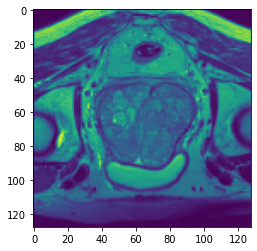

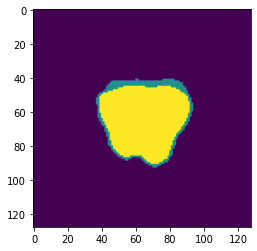

In [ ]:
plt.imshow(Xtrain[450])
plt.show()
plt.imshow(np.squeeze(Ytrain[450]))
plt.show()

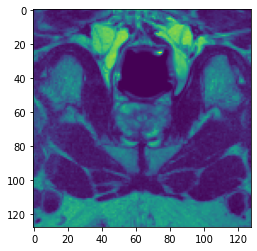

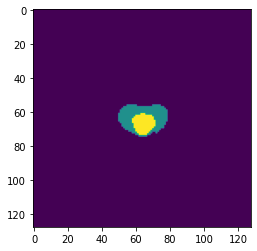

In [ ]:
plt.imshow(Xtest[84])
plt.show()
plt.imshow(np.squeeze(Ytest[84]))
plt.show()

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

In [ ]:
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam

In [ ]:
def dice_coef(y_true, y_pred, smooth = 1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


# Evaluation metrics: iou
def iou(y_true, y_pred, smooth = 1.):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true) + K.sum(y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

In [ ]:
EPOCH_STEP_TRAIN = NUM_TRAIN // 32 #BATCH_SIZE
EPOCH_STEP_TEST = NUM_TEST // 32 #BATCH_SIZE

In [ ]:


model1 = tf_unet(4)
model1.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss,
                metrics=[iou, dice_coef, 'binary_accuracy'])

val_loss, val_iou, val_dice, val_accuracy = model1.evaluate_generator( 
                                                steps=len(NUM_TEST)//BATCH_SIZE,
                                                verbose=1)

In [ ]:
TLmodel = load_model(TLmodel_path, 
                     custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
TLmodel.compile(optimizer=Adam(lr=1e-5), loss=dice_coef_loss,
                metrics=[iou, dice_coef, 'binary_accuracy'])



val_loss, val_iou, val_dice, val_accuracy = TLmodel.evaluate_generator( 
                                                steps=len(test_df)//batch_size,
                                                verbose=1)

print('Evaluation scores from V-Unet TL model:')
print('Validation loss: ', val_loss)
print('Validation dice coefficient: ', val_dice)
print('Validation iou: ', val_iou)
print('Validation accuracy: ', val_accuracy)

In [ ]:
def unet(n_levels, initial_features=32, n_blocks=2, kernel_size=3, pooling_size=2, in_channels=1, out_channels=1):
    inputs = keras.layers.Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, in_channels))
    x = inputs
    
    convpars = dict(kernel_size=kernel_size, activation='relu', padding='same')
    
    #downstream
    skips = {}
    for level in range(n_levels):
        for block in range(n_blocks):
            x = keras.layers.Conv2D(initial_features * 2 ** level, **convpars)(x)
            if block == 0:
              x = keras.layers.Dropout(0.1)(x)
        if level < n_levels - 1:
            skips[level] = x
            x = keras.layers.MaxPool2D(pooling_size)(x)
            
    # upstream
    for level in reversed(range(n_levels-1)):
        x = keras.layers.Conv2DTranspose(initial_features * 2 ** level, strides=pooling_size, **convpars)(x)
        x = keras.layers.Concatenate()([x, skips[level]])
        for block in range(n_blocks):    
          x = keras.layers.Conv2D(initial_features * 2 ** level, **convpars)(x)
          if block == 0:
            x = keras.layers.Dropout(0.1)(x) 
            
    # output
    activation = 'sigmoid' if out_channels == 1 else 'softmax'
    x = keras.layers.Conv2D(out_channels, kernel_size=1, activation=activation, padding='same')(x)
    
    return keras.Model(inputs=[inputs], outputs=[x], name=f'UNET-L{n_levels}-F{initial_features}')

In [ ]:
EPOCH_STEP_TRAIN = NUM_TRAIN // 32 #BATCH_SIZE
EPOCH_STEP_TEST = NUM_TEST // 32 #BATCH_SIZE

In [ ]:
model1 = unet(4)
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
model1.summary()

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime

# Cargamos la extensión, definimos la carpeta logs para guardar los datos de entrenamiento, y definimos el callback
%load_ext tensorboard
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

In [ ]:
results = model1.fit(Xtrain, Ytrain, validation_split=0.1, validation_steps=EPOCH_STEP_TEST,
                    validation_data=(Xtest,Ytest), steps_per_epoch=EPOCH_STEP_TRAIN,
                    batch_size=BATCH_SIZE, epochs=100, callbacks=[tensorboard_callback])


In [ ]:
model1.save(f'model_{IMAGE_HEIGHT}_{IMAGE_WIDTH}.h5')


In [ ]:

from tensorflow.keras.models import load_model
model12 = load_model('model1_128_128.h5')
model12.summary()

In [ ]:
preds12 = model12.predict(Xtest)

In [ ]:
preds1 = model1.predict(Xtest)

In [ ]:
preds12[55].shape

(128, 128, 1)

In [ ]:
preds1[55].shape

(128, 128, 1)

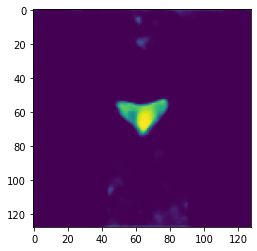

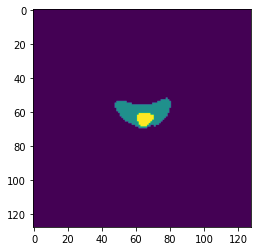

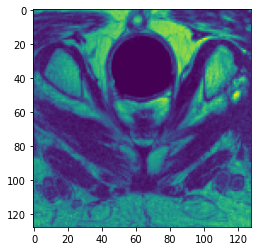

In [ ]:
plt.imshow(np.squeeze(preds1[55]))
plt.show()
plt.imshow(Ytest[55])
plt.show()
plt.imshow(Xtest[55])
plt.show()

In [ ]:
from IPython.display import Image


In [ ]:
Xtest.shape

(381, 128, 128)

In [ ]:
Ytest.shape

(381, 128, 128)

In [ ]:
np.squeeze(preds1).shape

(381, 128, 128)

In [ ]:
Ytest[min(0, Ytest.shape[0] - 1), :, :]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
from re import I
def visualize_data_gif(image, mask , predi):
    images = []
    for i in range(image.shape[0]):
        x = image[i,:,:]
        y = mask[i, :, :]
        z = predi[i, :, :]
        img = np.concatenate((x, y, z), axis=1)
        images.append(img)
    imageio.mimsave("gif.gif", images, duration=0.01)
    return Image(filename="gif.gif", format='png')

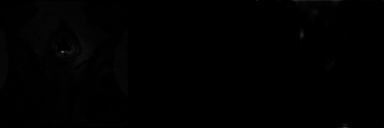

In [ ]:
visualize_data_gif(Xtest,Ytest,np.squeeze(preds1))

In [ ]:
cd gifs2

/content/drive/MyDrive/Colab Notebooks/Segmentation1/gifs2


In [ ]:
def dibujar(img,name):
  fig = plt.figure(frameon=False)
  ax = plt.Axes(fig, [0., 0., 1., 1.])
  ax.set_axis_off()
  fig.add_axes(ax)
  ax.imshow(img)
  fig.savefig(name, pdi=12)
  plt.close()
dibujar(Xtest[1],'img')
dibujar(Ytest[1],'mask')
dibujar(np.squeeze(preds1[1]),'pred')
#fig.savefig('out.png', pdi=12)

In [ ]:
filenamesimg = []
filenamesmask = []
filenamespred = []
for i in range(preds1.shape[0]):
    # plot the line chart
    dibujar(Xtest[i],f'{i}img.png')
    dibujar(Ytest[i],f'{i}mask.png')
    dibujar(np.squeeze(preds1[i]),f'{i}pred.png')
    
    # create file name and append it to a list
    filenameimg = f'{i}img.png'
    filenamesimg.append(filenameimg)
    filenamemask = f'{i}mask.png'
    filenamesmask.append(filenamemask)
    filenameprd = f'{i}pred.png'
    filenamespred.append(filenameprd)
    # save frame
 

In [ ]:

with imageio.get_writer('imga.gif', mode='I') as writer:
    for filename in filenamesimg:
        image = imageio.imread(filename)
        writer.append_data(image)

       
# Remove files
for filename in set(filenamesimg):
    os.remove(filename)
  

In [ ]:
with imageio.get_writer('mas.gif', mode='I') as writer:
    for filename in filenamesmask:
        image = imageio.imread(filename)
        writer.append_data(image)

for filename in set(filenamesmask):
    os.remove(filename)


In [ ]:

with imageio.get_writer('pred.gif', mode='I') as writer:
    for filename in filenamespred:
        image = imageio.imread(filename)
        writer.append_data(image) 

for filename in set(filenamespred):
    os.remove(filename)  

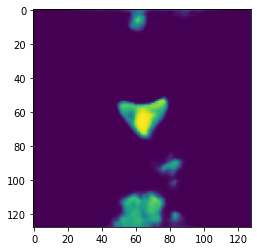

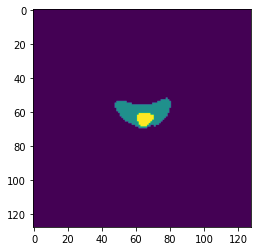

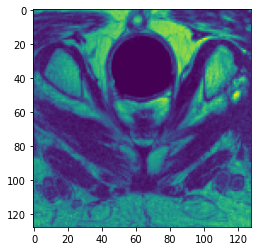

In [ ]:
plt.imshow(np.squeeze(preds1[55]))
plt.show()
plt.imshow(Ytest[55])
plt.show()
plt.imshow(Xtest[55])
plt.show()

In [ ]:
def dice_coef(y_true, y_pred, smooth = 1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)


# Evaluation metrics: iou
def iou(y_true, y_pred, smooth = 1.):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true) + K.sum(y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.layers import Activation, MaxPool2D, Concatenate


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)   #Not in the original network. 
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)

    return x

#Encoder block: Conv block followed by maxpooling


def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p   

#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

#Build Unet using the blocks
def build_unet(input_shape, n_classes):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024) #Bridge

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    if n_classes == 1:  #Binary
      activation = 'sigmoid'
    else:
      activation = 'softmax'

    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(d4)  #Change the activation based on n_classes
    print(activation)

    model = Model(inputs, outputs, name="U-Net")
    return model

In [ ]:
IMG_HEIGHT = Xtrain.shape[1]
IMG_WIDTH  = Xtrain.shape[2]
IMG_CHANNELS = 1
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)


In [ ]:
model = build_unet(input_shape, n_classes=1)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


sigmoid
Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 128, 128, 64  640         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_18 (BatchN  (None, 128, 128, 64  256        ['conv2d_19[0][0]']              
 ormalization)                  )                                                     

In [ ]:
results = model.fit(Xtrain, Ytrain, validation_split=0.1, validation_steps=EPOCH_STEP_TEST,
                    validation_data=(Xtest,Ytest), steps_per_epoch=EPOCH_STEP_TRAIN,
                    batch_size=BATCH_SIZE, epochs=100, callbacks=[tensorboard_callback])

Epoch 1/100
109/109 [==============================] - 32s 279ms/step - loss: 8.2779 - accuracy: 0.6850 - val_loss: 50.3946 - val_accuracy: 0.9526
Epoch 2/100
109/109 [==============================] - 29s 269ms/step - loss: 8.3189 - accuracy: 0.7061 - val_loss: 15.1500 - val_accuracy: 0.8829
Epoch 3/100
109/109 [==============================] - 30s 276ms/step - loss: 8.3741 - accuracy: 0.6991 - val_loss: 12.6318 - val_accuracy: 0.6428
Epoch 4/100
109/109 [==============================] - 30s 276ms/step - loss: 7.1667 - accuracy: 0.7157 - val_loss: 12.2540 - val_accuracy: 0.6547
Epoch 5/100
109/109 [==============================] - 30s 274ms/step - loss: 7.8537 - accuracy: 0.7071 - val_loss: 13.1142 - val_accuracy: 0.5263
Epoch 6/100
109/109 [==============================] - 30s 277ms/step - loss: 7.7989 - accuracy: 0.7033 - val_loss: 12.8152 - val_accuracy: 0.6520
Epoch 7/100
109/109 [==============================] - 30s 279ms/step - loss: 7.8926 - accuracy: 0.7087 - val_loss: 12

In [ ]:
model.save(f'model_{IMAGE_HEIGHT}_{IMAGE_WIDTH}.h5')



In [ ]:
from tensorflow.keras.models import load_model
model1 = load_model('model_128_128.h5')
model1.summary()

In [ ]:
preds = model.predict(Xtest)

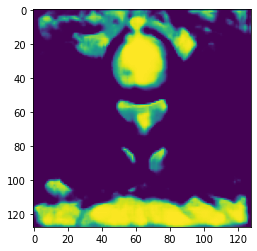

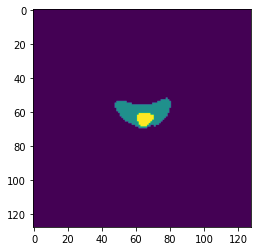

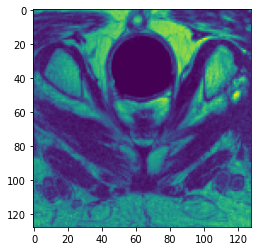

In [ ]:
plt.imshow(np.squeeze(preds[55]))
plt.show()
plt.imshow(Ytest[55])
plt.show()
plt.imshow(Xtest[55])
plt.show()

In [ ]:
preds = model.predict(Xtest)
plt.imshow(np.squeeze(preds[84]))
plt.show()
plt.imshow(Ytest[84])
plt.show()
plt.imshow(Xtest[84])
plt.show()

In [ ]:
model.save(f'model_{IMAGE_HEIGHT}_{IMAGE_WIDTH}.h5')
